<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/2_IslandElectricityData_ver2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [101]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

## General settings

In [102]:
usePreloadedData = True # True to load pre-prepared dataset , False to load directly from eirgrid data

cutOffDate = "2021-10-01 14:45:00"

In [103]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [104]:
import os
os.chdir('/content/drive/MyDrive/Github/Wind-Energy-Prediction')

#os.chdir('/content/drive/MyDrive/CA683Project')


# V2 Changes

- Load whole of Island data Region=ALL - as Republic of Ireland and Nortern Ireland work as 1 electricity market.

- Rename for convenience: 

  newdf = newdf.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})

  newdf = newdf.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})


  ## Add Interconnections with Great Britain (only international connections for now) from Eirgrid site
{' NET TOTAL(MW)': 'NetTotal_MW'})
{' EWIC(MW)': 'EWIC_MW'})
{' MOYLE(MW)': 'MOYLE_MW'})

The Interconnection flows displayed above represent the estimated current net electricity transfer in MW on the East West and Moyle Interconnectors; as measured at Deeside, Wales (EWIC) and Auchencrosh, Scotland (Moyle).

The East West Interconnector (EWIC) connects Ireland and Wales, between Deeside in North Wales and Woodland, Co. Meath in Ireland. Approximately 260km in length, the underground and undersea link has the capacity to transport 500 Mega Watts (MW) -enough energy to power 300,000 homes.

The Moyle Interconnector links the electricity grids of Northern Ireland and Scotland through submarine cables running between converter stations at Ballycronan More in Islandmagee, Co. Antrim and Auchencrosh in Ayrshire, Scotland. The link has a capacity of 500MW.


# Eirgrid Wind generation
http://smartgriddashboard.eirgrid.com/#all

In [105]:
if usePreloadedData == False:
  # Wind energy Actual and Prediction
  
  sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Jan-2018%2000:00&dateto=31-Jan-2018%2023:59'

  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-'
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  years = ['2017', '2018', '2019', '2020', '2021']
  #years = ['2020', '2021']
  months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
  endDay= [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
  tempds = []
  months_years = []

  for year in years:
    i = 0
    for month in months:
      # Stop after Aug 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
        
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)
      #url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Dec-2020%2000:00&dateto=31-Dec-2020%2023:59'


  wgds = pd.concat(tempds, keys=months_years)
  
  wgds = wgds.reset_index()
  wgds = wgds.drop('level_0', axis=1)
  wgds = wgds.drop('level_1', axis=1)
  wgds = wgds.drop('DATE & TIME', axis=1)


# Eirgrid Actual System Generation

In [106]:
if usePreloadedData == False:
  # Wind energy Actual and Prediction
  sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=23-Jan-2021%2000:00&dateto=21-Feb-2021%2001:15'

  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-'

  tempds = []
  months_years = []

  for year in years:
    i = 0
    for month in months:
      # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
        
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)
      #url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Dec-2020%2000:00&dateto=31-Dec-2020%2023:59'


  sgds = pd.concat(tempds, keys=months_years)
  
  sgds = sgds.reset_index()
  sgds = sgds.drop('level_0', axis=1)
  sgds = sgds.drop('level_1', axis=1)
  sgds = sgds.drop('DATE & TIME', axis=1)

# System Demand: Actual and Prediction

### Data description
* **System Demand** - represents the predicted electricity production required to meet national consumption.
* **Sdate** - 
* **SREGION** - 
* **SActualDemandMW** - 
* **SFORECAST DEMAND(MW)** - 
* **SFORECAST WIND(MW)** - 
* **SActualWindMW** - 
* **Shour** - 
* **Sisweekday** - 
* **Smonth** - 
  
Actual and forecast System Demand are shown in **15 minute intervals.**

The data came from EirGrid Group about all island power systems and has been prepared by us for further analysis.

Source: https://smartgriddashboard.eirgrid.com/#all/demand

In [107]:
if usePreloadedData == False:
  # Demand Actual and Prediction
  sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=18-Jan-2021%2000:00&dateto=16-Feb-2021%2023:59'
  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-'

  i = 0
  tempds = []

  for year in years:
    i = 0
    for month in months:
       # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)

  sdds = pd.concat(tempds, keys=months_years)
  sdds = sdds.reset_index()
  sdds = sdds.drop('level_0', axis=1)
  sdds = sdds.drop('level_1', axis=1)
  sdds = sdds.drop('DATE & TIME', axis=1)


# Eirgrid Interconnections

The Interconnection flows displayed above represent the estimated current net electricity transfer in MW on the East West and Moyle Interconnectors; as measured at Deeside, Wales (EWIC) and Auchencrosh, Scotland (Moyle).

The East West Interconnector (EWIC) connects Ireland and Wales, between Deeside in North Wales and Woodland, Co. Meath in Ireland. Approximately 260km in length, the underground and undersea link has the capacity to transport 500 Mega Watts (MW) -enough energy to power 300,000 homes.

The Moyle Interconnector links the electricity grids of Northern Ireland and Scotland through submarine cables running between converter stations at Ballycronan More in Islandmagee, Co. Antrim and Auchencrosh in Ayrshire, Scotland. The link has a capacity of 500MW.


In [108]:


if usePreloadedData == False:
  # Interconnections Actual and Prediction
  sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=27-Jan-2021%2000:00&dateto=25-Feb-2021%2022:00'
  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-'

  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  tempds = []
  months_years = []

  i = 0
  tempds = []

  for year in years:
    i = 0
    for month in months:
      # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)

  icds = pd.concat(tempds, keys=months_years)
  icds = icds.reset_index()
  icds = icds.drop('level_0', axis=1)
  icds = icds.drop('level_1', axis=1)
  icds = icds.drop('DATE & TIME', axis=1)

  icds.tail()


# Merge CSV to have all data based on Date and Region: All Island

In [109]:
if usePreloadedData == False:
  left = sdds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
  middle = wgds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
  right = sgds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
  #right.index = right.index.tz_convert(None)

  newdf = left.join(middle)
  newdf = newdf.join(right)
  newdf = newdf.reset_index()

  newdf = newdf.rename(columns={' ACTUAL DEMAND(MW)' : 'ActualDemandMW'})
  newdf = newdf.rename(columns={'  ACTUAL WIND(MW)' : 'ActualWindMW'})

  newdf = newdf.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
  newdf = newdf.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})


  # Region doesn't apply to Interconnections
  left = newdf.set_index(['date', 'Year', 'Month', 'DayTime'])
  right = icds.set_index(['date', 'Year', 'Month', 'DayTime'])
  newdf = left.join(right)
  newdf = newdf.reset_index()

  newdf = newdf.rename(columns={' NET TOTAL(MW)': 'NetTotal_MW'})
  newdf = newdf.rename(columns={' EWIC(MW)': 'EWIC_MW'})
  newdf = newdf.rename(columns={' MOYLE(MW)': 'MOYLE_MW'})

  newdf.to_csv("Data/IslandElectricityOnly2017_2020v3.csv") 
else:
  #fileP = 'IslandElectricityOnly2017_2020v3.csv'
  fileP = 'Data/IslandElectricityOnly2017_2020v3Clean.csv'
  newdf = pd.read_csv(fileP, parse_dates=[1])

newdf["hour"] = 0
newdf["isweekday"] = False
newdf["month"] = 0
newdf["year"] = 0

def settimeatt(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6) 
    row["month"] = row.date.month
    row["year"] = row.date.year
    return row
newdf = newdf.apply(settimeatt, axis='columns')
  
newdf.head()

,Unnamed: 0,date,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year
0,0,2017-07-01 00:00:00,2394.75,287.0,280.25,2580.75,-221.00,11.702683,0,False,7,2017
1,1,2017-07-01 01:00:00,2961.50,319.5,423.25,3402.00,-406.75,14.291744,1,False,7,2017
2,2,2017-07-01 02:00:00,2785.25,320.0,451.25,3411.75,-388.00,16.201418,2,False,7,2017
3,3,2017-07-01 03:00:00,2716.25,347.5,512.75,3500.00,-534.75,18.877128,3,False,7,2017
4,4,2017-07-01 04:00:00,2654.00,410.5,576.75,3330.00,-430.50,21.731349,4,False,7,2017


In [110]:
newdf.columns

Index(['Unnamed: 0', 'date', 'ActualDemandMW', 'ForecastWndMW', 'ActualWindMW',
       'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent', 'hour',
       'isweekday', 'month', 'year'],
      dtype='object')

In [111]:
newdf.describe()

,Unnamed: 0,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year
count,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000,37272.000000
mean,18635.500000,4214.501355,1366.772088,1321.031867,4215.939526,31.475256,31.716800,11.500000,6.609788,2019.115261
std,10759.643953,831.706221,1087.036447,985.505163,754.167759,530.157222,23.147838,6.922279,3.368733,1.278490
min,0.000000,2394.750000,0.000000,-44.750000,1939.250000,-1415.000000,-0.943098,0.000000,1.000000,2017.000000
25%,9317.750000,3501.000000,460.250000,456.000000,3712.500000,-450.750000,11.102421,5.750000,4.000000,2018.000000
50%,18635.500000,4282.500000,1075.250000,1116.000000,4149.500000,-6.000000,27.075595,11.500000,7.000000,2019.000000
75%,27953.250000,4829.500000,2050.062500,2069.500000,4680.812500,446.000000,50.154915,17.250000,9.000000,2020.000000
max,37271.000000,6859.500000,6309.250000,4804.500000,7795.500000,978.250000,94.807763,23.000000,12.000000,2021.000000


In [112]:
#Krystian: Checking how many months do we have in our dataset (if the year is complete)
newdf.month.unique()

array([ 7,  8,  9, 10, 11, 12,  1,  2,  3,  4,  5,  6])

In [113]:
#Krystian: Looking for maximal extreme values
print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.tail()

-----------DATA SIZE -------------
(37272, 12)
Rows:  37272 , Columns:  12
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37272 entries, 0 to 37271
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          37272 non-null  int64         
 1   date                37272 non-null  datetime64[ns]
 2   ActualDemandMW      37272 non-null  float64       
 3   ForecastWndMW       37272 non-null  float64       
 4   ActualWindMW        37272 non-null  float64       
 5   ActualGenerationMW  37272 non-null  float64       
 6   NetTotal_MW         37272 non-null  float64       
 7   WindMWPercent       37272 non-null  float64       
 8   hour                37272 non-null  int64         
 9   isweekday           37272 non-null  bool          
 10  month               37272 non-null  int64         
 11  year                37272 non-null  int64       

,Unnamed: 0,date,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year
37267,37267,2021-09-30 19:00:00,5420.25,2477.75,2334.50,5609.75,-205.00,43.069969,19,True,9,2021
37268,37268,2021-09-30 20:00:00,5289.25,2721.00,2279.75,5250.50,23.50,43.101574,20,True,9,2021
37269,37269,2021-09-30 21:00:00,4871.75,2973.00,2321.25,4991.50,-133.25,47.647149,21,True,9,2021
37270,37270,2021-09-30 22:00:00,4357.75,3217.25,2381.00,4884.25,-537.25,54.638288,22,True,9,2021
37271,37271,2021-09-30 23:00:00,3861.00,3385.00,2492.50,4434.75,-547.00,64.555815,23,True,9,2021


# Visualisations

In [114]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='ActualDemandMW')
fig.show()

In [115]:
# import plotly.express as px
# Krystian: Checking hourly utilisation of the energy in each month
# Visible outliers

fig2 = px.scatter(newdf, x='hour', y='ActualDemandMW', color='month')
fig2.show()

In [116]:
# Krystian: Checking Forecast Wind in MW vs number of measurement of Actual Wind on weekdays vs weekends
# ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)', ' FORECAST WIND(MW)', 'ActualWindMW', 'hour', 'isweekday', 'month']
fig3 = px.histogram(newdf, x='ActualWindMW', y='ForecastWndMW', color='isweekday',
            title="Checking Forecast Wind in MW vs number of measurement of Actual Wind on weekdays vs weekends",
            width=800, height=600,
            template="simple_white"
            )
fig3.show()

In [117]:
# Krystian: 
# ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)', ' FORECAST WIND(MW)', 'ActualWindMW', 'hour', 'isweekday', 'month']

# year = pd.DatetimeIndex(newdf['date']).year.unique()
# month = pd.DatetimeIndex(newdf['date']).month.unique()
# pd.DatetimeIndex(newdf['date']).day.unique()

# fig4 = px.box(newdf, x='month', y="ActualDemandMW") #points='all')
fig4 = px.box(newdf, x='month', y="ActualDemandMW", color="isweekday",
             notched=True,
             title="Actual Demand measured in MW each month by type of the day",
             hover_data=["ActualDemandMW"]
            )
fig4.show()

In [118]:
# Krystian: 
# ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)', ' FORECAST WIND(MW)', 'ActualWindMW', 'hour', 'isweekday', 'month']

val = ['month', 'ActualDemandMW', 'ActualWindMW', 'hour']

one_mth = newdf.loc[pd.DatetimeIndex(newdf['date']).month == 12]
fig5 = px.parallel_coordinates(one_mth, color="hour", dimensions=val, title="Analysis of December housely usage")

# fig5 = px.parallel_coordinates(newdf['ActualDemandMW','ActualWindMW'], color=newdf['month'], 
#                              color_continuous_scale=px.colors.diverging.Tealrose,
#                              color_continuous_midpoint=2)
fig5.show()

In [119]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='isweekday')
fig.show()

In [120]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='month', color='isweekday')
fig.show()

In [121]:

fig = px.scatter(newdf, x='date', y='ActualWindMW')
fig.show()

# Load Weather Data
Load prepared Weather data from weather stations: Belmullet (suffix _BEL), Dublin Airport (_DUB), Shannon Airport (No suffix) and Cork Airport (suffix _COR)

For each station, for example Cork Airport, please see the on https://data.gov.ie/dataset/cork-airport-hourly-data :

Hourly Elements:

| ID | ELEMENT | Unit |
| --- | --- | --- |       
|rain|Precipitation Amount|mm|
|**temp**|Air Temperature|°C|
| wetb|	Wet Bulb Air Temperature|  °C|
|dewpt| Dew Point Air Temperature|	°C	|	
|vappr|	Vapour Pressure	|		hpa|
|rhum	|	Relative Humidity	|	%|
|msl	|	Mean Sea Level Pressure				|		hPa|
|**wdsp**	|	Mean Hourly Wind Speed		|		kt|
|wddir|	Predominant Hourly wind Direction	|	kt|
|ww		Synop Code Present Weather - decode below
|w		Synop Code Past Weather - decode below
|sun		Sunshine duration						hours
|vis		Visibility							m
|clht		Cloud Ceiling Height - if none value is 999			100s feet
|clamt		Cloud Amount							okta

In [122]:
weatherds = pd.read_csv("Data/IrelandWeatherData.csv", na_values=" ")

weatherds

,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,...,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,ind_MAL,rain_MAL,ind.1_MAL,temp_MAL,ind.2_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,ind.3_MAL,wdsp_MAL,ind.4_MAL,wddir_MAL,ww_MAL,w_MAL,sun_MAL,vis_MAL,clht_MAL,clamt_MAL
0,2017-01-01 00:00:00,0,0.0,0,5.2,0,3.9,2.0,7.1,79,1023.0,2,13,2,340,NaN,NaN,NaN,NaN,NaN,NaN,0,0.9,0,5.3,0,4.7,3.9,8.1,91,1019.9,2,12,2,340,61,62,0.0,25000,45,...,0,1.4,0,8.0,0,7.6,7.1,10.1,94,1020.9,2,11,2,230,61,62,0.0,9000.0,22,8,0,0.0,0,6.3,0,4.3,1.4,6.7,70,1020.6,2,19,2,340.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2017-01-01 01:00:00,0,0.5,0,4.7,0,3.4,1.4,6.8,78,1023.6,2,15,2,350,NaN,NaN,NaN,NaN,NaN,NaN,0,0.2,0,4.9,0,4.6,4.3,8.2,95,1019.7,2,8,2,310,61,66,0.0,25000,60,...,0,1.7,0,6.1,0,5.7,5.1,8.8,94,1020.6,2,16,2,320,61,66,0.0,20000.0,8,8,0,0.3,0,5.3,0,4.1,2.2,7.2,80,1021.1,2,22,2,340.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-01-01 02:00:00,0,0.0,0,5.7,0,3.8,0.7,6.4,70,1023.7,2,16,2,360,NaN,NaN,NaN,NaN,NaN,NaN,0,0.1,0,5.0,0,4.5,3.7,8.0,92,1019.8,2,8,2,310,21,62,0.0,30000,60,...,0,0.2,0,4.8,0,4.3,3.6,7.9,92,1020.3,2,16,2,350,21,62,0.0,25000.0,80,7,0,0.1,0,6.1,0,4.1,1.0,6.6,69,1021.6,2,24,2,350.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-01-01 03:00:00,0,0.4,0,5.6,0,3.3,-0.6,5.9,64,1024.3,2,19,2,360,NaN,NaN,NaN,NaN,NaN,NaN,2,0.0,0,4.2,0,3.6,2.7,7.4,90,1020.2,2,12,2,330,21,62,0.0,30000,60,...,0,0.0,0,4.8,0,4.3,3.5,7.9,92,1020.4,2,14,2,340,2,62,0.0,25000.0,10,7,0,0.0,0,6.5,0,4.5,1.6,6.8,70,1022.0,2,23,2,360.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-01-01 04:00:00,0,0.6,0,4.7,0,3.1,0.5,6.3,74,1024.8,2,20,2,10,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,3.6,0,2.9,1.9,7.0,88,1020.2,2,11,2,330,2,11,0.0,30000,200,...,0,0.1,0,4.3,0,3.6,2.6,7.3,88,1021.0,2,14,2,350,21,62,0.0,30000.0,50,7,0,0.1,0,6.6,0,4.6,1.7,6.9,71,1022.4,2,27,2,360.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41612,2021-09-30 20:00:00,0,0.0,0,13.0,0,11.9,10.9,13.1,87,1001.6,2,12,2,230,NaN,NaN,NaN,NaN,NaN,NaN,0,0.1,0,14.2,0,12.6,11.2,13.3,82,1004.8,2,11,2,200,21,62,0.0,15000,200,...,0,0.0,0,12.4,0,11.1,9.9,12.2,85,1008.5,2,15,2,230,2,11,0.0,25000.0,120,7,0,0.2,0,11.8,0,11.1,10.4,12.6,91,1001.1,2,11,2,210.0,NaN,NaN,NaN,NaN,NaN,NaN
41613,2021-09-30 21:00:00,0,0.0,0,12.8,0,11.9,11.1,13.2,89,1000.1,2,13,2,220,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,14.2,0,12.6,11.1,13.3,82,1004.1,2,12,2,210,2,62,0.0,15000,25,...,0,0.0,0,12.0,0,11.2,10.4,12.7,90,1007.7,2,16,2,220,2,62,0.0,25000.0,120,7,0,0.0,0,11.5,0,10.9,10.3,12.5,92,1000.4,2,8,2,200.0,NaN,NaN,NaN,NaN,NaN,NaN
41614,2021-09-30 22:00:00,0,0.2,0,13.0,0,12.3,11.6,13.7,91,999.0,2,13,2,220,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,13.8,0,12.3,10.9,13.1,83,1003.9,2,10,2,220,2,11,0.0,20000,50,...,2,0.0,0,12.5,0,11.6,10.8,12.9,89,1007.1,2,16,2,210,80,82,0.0,25000.0,70,7,0,0.0,0,11.2,0,10.6,10.1,12.3,93,999.6,2,7,2,190.0,NaN,NaN,NaN,NaN,NaN,NaN
41615,2021-09-30 23:00:00,0,1.4,0,11.8,0,10.9,10.1,12.3,89,998.2,2,17,2,230,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,13.4,0,12.1,11.0,13.1,85,1003.3,2,8,2,230,2,11,0.0,20000,40,...,0,0.2,0,12.6,0,11.9,11.3,13.4,92,1006.2,2,14,2,230,25,82,0.0,25000.0,70,7,0,0.1,0,11.4,0,11.0,10.6,12.8,94,998.5,2,8,2,170.0,NaN,NaN,NaN,NaN,NaN,NaN


In [123]:
weatherds.describe()

,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,...,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,ind_MAL,rain_MAL,ind.1_MAL,temp_MAL,ind.2_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,ind.3_MAL,wdsp_MAL,ind.4_MAL,wddir_MAL,ww_MAL,w_MAL,sun_MAL,vis_MAL,clht_MAL,clamt_MAL
count,41617.0,41617.000000,41617.0,41617.000000,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.0,41617.000000,41617.0,41617.000000,0.0,0.0,0.0,0.0,0.0,0.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.0,41617.000000,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,...,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.0,41617.000000,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41615.000000,41617.000000,41617.000000,41617.000000,41616.000000,41617.0,41617.000000,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.0,41617.000000,41617.000000,41615.000000,0.0,0.0,0.0,0.0,0.0,0.0
mean,0.0,0.151734,0.0,10.526352,0.0,9.100848,7.490799,10.748379,81.810006,1012.057431,2.0,11.937694,2.0,199.092919,NaN,NaN,NaN,NaN,NaN,NaN,0.476079,0.083651,0.020088,9.982531,0.029651,8.459372,6.776144,10.300260,81.606627,1013.476877,2.0,9.684552,2.0,205.819016,14.575510,29.121633,0.170310,27886.183531,288.256866,5.617680,...,0.659298,0.143590,0.007040,10.134777,0.024077,8.816251,7.627712,10.889355,85.490953,1014.280854,2.0,9.737055,2.0,213.285677,16.706466,32.193791,0.174993,28538.636549,282.723647,5.593628,-0.000024,0.129957,0.0,10.124199,0.0,8.703477,7.054180,10.439527,81.351107,1011.589062,2.0,14.706754,2.000240,199.572510,NaN,NaN,NaN,NaN,NaN,NaN
std,0.0,0.494055,0.0,4.013934,0.0,3.813173,4.272689,3.065398,11.207680,13.183539,0.0,6.602844,0.0,93.156817,NaN,NaN,NaN,NaN,NaN,NaN,0.962739,0.405475,0.140303,5.106029,0.171036,4.512318,4.586692,3.198644,12.170589,12.499044,0.0,4.833405,0.0,82.391959,22.509361,26.676625,0.325097,13441.528931,401.640042,2.256606,...,1.151681,0.544786,0.083612,4.605307,0.260214,5.021743,4.485376,3.245872,12.258688,12.161285,0.0,5.115091,0.0,84.873132,23.176695,27.810950,0.335843,17833.523421,417.562417,2.389249,0.004902,0.466200,0.0,3.913133,0.0,3.804861,4.294393,3.015872,9.886587,13.246404,0.0,7.277758,0.034661,86.750518,NaN,NaN,NaN,NaN,NaN,NaN
min,0.0,0.000000,0.0,-3.300000,0.0,-4.400000,-9.700000,2.900000,24.000000,959.100000,2.0,0.000000,2.0,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,-5.600000,0.000000,-49.900000,-8.900000,3.100000,24.000000,965.900000,2.0,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,-6.900000,0.000000,-49.000000,-9.200000,3.100000,26.000000,967.700000,2.0,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,15.000000,1.000000,0.000000,-1.000000,0.000000,0.0,-2.000000,0.0,-3.000000,-7.900000,3.400000,20.000000,956.600000,2.0,1.000000,2.000000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.0,0.000000,0.0,7.700000,0.0,6.300000,4.300000,8.300000,74.000000,1003.700000,2.0,7.000000,2.0,140.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,6.400000,0.000000,5.200000,3.400000,7.800000,74.000000,1005.600000,2.0,6.000000,2.0,140.000000,2.000000,11.000000,0.000000,20000.000000,24.000000,4.000000,...,0.000000,0.000000,0.000000,7.000000,0.000000,6.000000,4.300000,8.300000,78.000000,1007.000000,2.0,6.000000,2.0,160.000000,2.000000,11.000000,0

In [124]:
weatherds.dtypes[0:50]

date          object
ind_BEL        int64
rain_BEL     float64
ind.1_BEL      int64
temp_BEL     float64
ind.2_BEL      int64
wetb_BEL     float64
dewpt_BEL    float64
vappr_BEL    float64
rhum_BEL       int64
msl_BEL      float64
ind.3_BEL      int64
wdsp_BEL       int64
ind.4_BEL      int64
wddir_BEL      int64
ww_BEL       float64
w_BEL        float64
sun_BEL      float64
vis_BEL      float64
clht_BEL     float64
clamt_BEL    float64
ind_DUB        int64
rain_DUB     float64
ind.1_DUB      int64
temp_DUB     float64
ind.2_DUB      int64
wetb_DUB     float64
dewpt_DUB    float64
vappr_DUB    float64
rhum_DUB       int64
msl_DUB      float64
ind.3_DUB      int64
wdsp_DUB       int64
ind.4_DUB      int64
wddir_DUB      int64
ww_DUB         int64
w_DUB          int64
sun_DUB      float64
vis_DUB        int64
clht_DUB       int64
clamt_DUB      int64
ind            int64
rain         float64
ind.1          int64
temp         float64
ind.2          int64
wetb         float64
dewpt        

In [125]:

# Reduce timeframe 2017-07-01
weatherds = weatherds[(weatherds.date >= "2017-07-01 00:00:00") & (weatherds.date < cutOffDate)]

In [126]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Belmullet"))


fig.add_trace(go.Scatter(x=weatherds['date'], y=weatherds['wdsp'],
                    mode='lines',
                    name='Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=weatherds['date'], y=weatherds['temp'],
                    mode='lines',
                    name='Temperature',showlegend=True), 1, 1, secondary_y=True)


fig.update_layout(
    title_text="Wind speed vs. Temperatures",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=4000,
    height=500
)
fig.show()

In [127]:
weatherds.shape

(37273, 101)

In [128]:
# Unused indicator numbers
weatherds = weatherds.drop(['ind', 'ind.1', 'ind.2', 'ind.3', 'ind.4'], axis=1)
weatherds = weatherds.drop(['ind_BEL', 'ind.1_BEL', 'ind.2_BEL', 'ind.3_BEL', 'ind.4_BEL'], axis=1)
weatherds = weatherds.drop(['ind_COR', 'ind.1_COR', 'ind.2_COR', 'ind.3_COR', 'ind.4_COR'], axis=1)
weatherds = weatherds.drop(['ind_DUB', 'ind.1_DUB', 'ind.2_DUB', 'ind.3_DUB', 'ind.4_DUB'], axis=1)
weatherds = weatherds.drop(['ind_MAL', 'ind.1_MAL', 'ind.2_MAL', 'ind.3_MAL', 'ind.4_MAL'], axis=1)

In [129]:
# Remove 0 only columns
weatherds = weatherds.drop(['ww_BEL', 'w_BEL', 'sun_BEL', 'vis_BEL', 'clht_BEL', 'clamt_BEL'], axis=1)
weatherds = weatherds.drop(['ww_MAL', 'w_MAL', 'sun_MAL', 'vis_MAL', 'clht_MAL', 'clamt_MAL'], axis=1)

In [130]:
weatherds.isnull().sum()[0:50]

date         0
rain_BEL     0
temp_BEL     0
wetb_BEL     0
dewpt_BEL    0
vappr_BEL    0
rhum_BEL     0
msl_BEL      0
wdsp_BEL     0
wddir_BEL    0
rain_DUB     0
temp_DUB     0
wetb_DUB     0
dewpt_DUB    0
vappr_DUB    0
rhum_DUB     0
msl_DUB      0
wdsp_DUB     0
wddir_DUB    0
ww_DUB       0
w_DUB        0
sun_DUB      0
vis_DUB      0
clht_DUB     0
clamt_DUB    0
rain         0
temp         0
wetb         0
dewpt        0
vappr        0
rhum         0
msl          0
wdsp         0
wddir        0
ww           0
w            0
sun          0
vis          0
clht         0
clamt        0
rain_COR     0
temp_COR     0
wetb_COR     0
dewpt_COR    0
vappr_COR    0
rhum_COR     0
msl_COR      0
wdsp_COR     0
wddir_COR    0
ww_COR       0
dtype: int64

In [131]:
weatherds.isnull().sum()[50:76]

w_COR        0
sun_COR      0
vis_COR      2
clht_COR     0
clamt_COR    0
rain_MAL     1
temp_MAL     0
wetb_MAL     0
dewpt_MAL    0
vappr_MAL    0
rhum_MAL     0
msl_MAL      0
wdsp_MAL     0
wddir_MAL    2
dtype: int64

In [132]:
# Backfill a few missing values
weatherds.fillna(method='ffill', limit=3, inplace=True)

# Merge datasets and EDA

In [133]:
right = newdf.set_index(['date'])
left = weatherds.set_index(['date'])
newdf = left.join(right)

newdf = newdf.reset_index()

In [134]:
newdf.columns

Index(['date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL',
       'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB',
       'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB',
       'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl',
       'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR',
       'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL', 'wetb_MAL',
       'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year'],
      dtype='object')

In [135]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("newdf"))


fig.add_trace(go.Scatter(x=newdf['date'], y=(newdf['wdsp']^2),
                    mode='lines',
                    name='Shannon Wind Speed ^ 2',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=newdf['date'], y=(newdf['wdsp_MAL']^2),
                    mode='lines',
                    name='Malin head Wind Speed ^ 2',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=newdf['date'], y=(newdf['ActualWindMW']),
                    mode='lines',
                    name='Wind Generation',showlegend=True), 1, 1, secondary_y=True)


fig.update_layout(
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=2000,
    height=500
)
fig.show()

In [136]:
newdf.columns

Index(['date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL',
       'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB',
       'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB',
       'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl',
       'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR',
       'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL', 'wetb_MAL',
       'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year'],
      dtype='object')

In [137]:
newdf.to_csv("Data/IslandElectricity2017_2020v3.csv") 

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5]), <a list of 24 Text major ticklabel objects>)

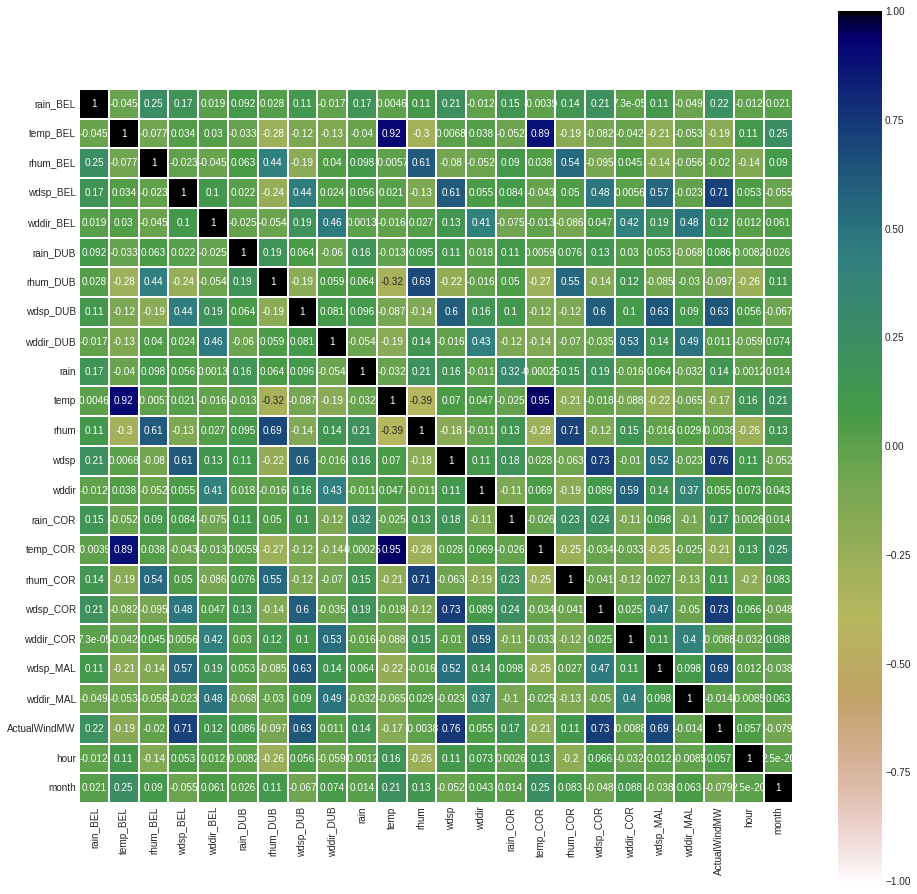

In [138]:
col_list_numerical = ['rain_BEL', 'temp_BEL', 
       'rhum_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'rhum_DUB', 'wdsp_DUB',
       'wddir_DUB', 'rain', 'temp', 'rhum', 'wdsp',
       'wddir', 
       'rain_COR', 'temp_COR', 'rhum_COR',
       'wdsp_COR', 'wddir_COR',  
       'wdsp_MAL', 'wddir_MAL', 
       'ActualWindMW', 'hour', 'isweekday', 'month']

df_corr = newdf[col_list_numerical].corr()

plt.figure(figsize=[16, 16])
sns.heatmap(data=df_corr, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Wind capacity

In [139]:

windcapa_P = 'Data/WindInstalledCapacities_MW_Monthly - Sheet1.csv'
windcapa_df = pd.read_csv(windcapa_P, header=3, na_values=['-   ', "  -   "],
                          skipinitialspace=True, thousands=",")

In [140]:
windcapa_df.tail(10)

,YYYY,Mon,Month,TSO,DSO,Total,TSO.1,DSO.1,Total.1,Total.2
344,2020,Sep,Sep-2020,2019.75,2227.091,4246.841,121.1,1155.154,1276.254,5523.095
345,2020,Oct,Oct-2020,2019.75,2235.091,4254.841,121.1,1155.154,1276.254,5531.095
346,2020,Nov,Nov-2020,2019.75,2235.091,4254.841,121.1,1155.154,1276.254,5531.095
347,2020,Dec,Dec-2020,2064.75,2235.091,4299.841,121.1,1155.154,1276.254,5576.095
348,2021,Jan,Jan-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN
349,2021,Feb,Feb-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN
350,2021,Mar,Mar-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN
351,2021,Apr,Apr-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN
352,2021,May,May-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN
353,2021,Jun,Jun-2021,2074.05,NaN,NaN,121.1,1155.154,1276.254,NaN


In [141]:
windcapa_df['day'] = "01-"
windcapa_df['date'] = windcapa_df['day'] + windcapa_df['Month']

In [142]:
windcapa_df['date'] = pd.to_datetime(windcapa_df['date'].str.replace('.Sept.', '-Sep-', regex=True), format="%d-%b-%Y")

In [143]:
windcapa_df.rename(columns={'Total.2' : 'TotalWindCapacityMW'}, inplace=True)

Merge based on month date

In [144]:
left = newdf.set_index(['date'])
right = windcapa_df[['date', 'TotalWindCapacityMW']].set_index(['date'])
newdfv4 = left.join(right)

#newdfv4 = newdf.reset_index()

In [145]:
newdfv4['TotalWindCapacityMW'].fillna(method='ffill', inplace=True)
newdfv4 = newdfv4.reset_index()
newdfv4.isnull().sum()

date                   0
rain_BEL               0
temp_BEL               0
wetb_BEL               0
dewpt_BEL              0
                      ..
hour                   1
isweekday              1
month                  1
year                   1
TotalWindCapacityMW    0
Length: 76, dtype: int64

In [146]:
# Drop the 1 record with mssing value
newdfv4.dropna(axis=0, subset=['hour'], inplace=True)


In [147]:
newdfv4.to_csv("Data/IslandElectricity2017_2020v4.csv") 

In [148]:
newdfv4.columns

Index(['date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL',
       'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB',
       'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB', 'clht_DUB',
       'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl',
       'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR', 'sun_COR', 'vis_COR',
       'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL', 'wetb_MAL',
       'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW'],
      dtype='object')

In [149]:
newdfv4[col_list_numerical].dtypes

rain_BEL        float64
temp_BEL        float64
rhum_BEL          int64
wdsp_BEL          int64
wddir_BEL         int64
rain_DUB        float64
rhum_DUB          int64
wdsp_DUB          int64
wddir_DUB         int64
rain            float64
temp            float64
rhum              int64
wdsp              int64
wddir             int64
rain_COR        float64
temp_COR        float64
rhum_COR          int64
wdsp_COR          int64
wddir_COR         int64
wdsp_MAL          int64
wddir_MAL       float64
ActualWindMW    float64
hour            float64
isweekday        object
month           float64
dtype: object

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5]), <a list of 25 Text major ticklabel objects>)

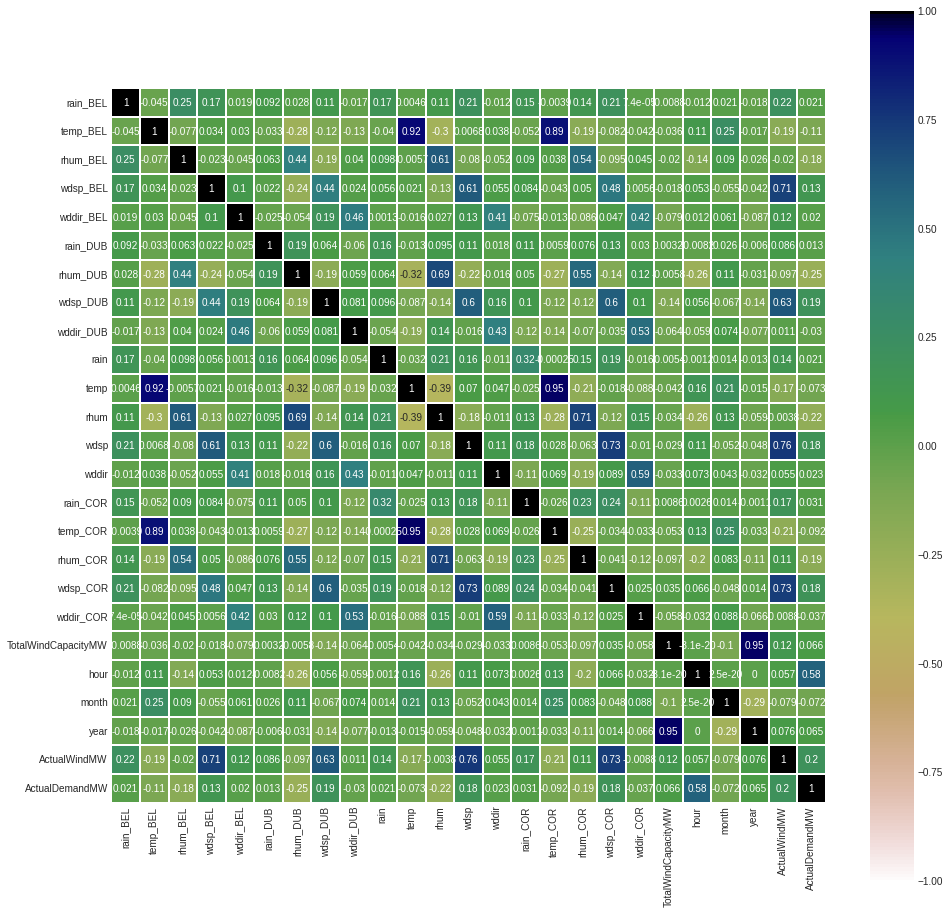

In [150]:
col_list_numerical = ['rain_BEL', 'temp_BEL', 
       'rhum_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'rhum_DUB', 'wdsp_DUB',
       'wddir_DUB', 'rain', 'temp', 'rhum', 'wdsp',
       'wddir', 
       'rain_COR', 'temp_COR', 'rhum_COR',
       'wdsp_COR', 'wddir_COR', 'TotalWindCapacityMW',  
       'hour', 'isweekday', 'month', 'year', 'ActualWindMW', 'ActualDemandMW']

df_corr = newdfv4[col_list_numerical].corr()

plt.figure(figsize=[16, 16])
sns.heatmap(data=df_corr, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

In [151]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("newdf"))


fig.add_trace(go.Scatter(x=newdfv4['date'], y=(newdfv4['TotalWindCapacityMW']),
                    mode='lines',
                    name='Wind Installed Capacity ',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=newdfv4['date'], y=(newdfv4['ActualWindMW']),
                    mode='lines',
                    name='Wind Generation',showlegend=True), 1, 1, secondary_y=True)


fig.update_layout(
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1000,
    height=500
)
fig.show()

# Electricity Generation by fuel type

Data from https://www.seai.ie/data-and-insights/seai-statistics/monthly-energy-data/electricity/

In [152]:
#/content/drive/MyDrive/CA683Project/seai_Electricity_Monthly_Timeseries.csv
  
filename = 'Data/seai_Electricity_Monthly_Timeseries.csv'
eGen = pd.read_csv(filename, header=0)

eGen

,Electricity Generation (GWh),Label,Notes,Jan-10,Feb-10,Mar-10,Apr-10,May-10,Jun-10,Jul-10,Aug-10,Sep-10,Oct-10,Nov-10,Dec-10,Jan-11,Feb-11,Mar-11,Apr-11,May-11,Jun-11,Jul-11,Aug-11,Sep-11,Oct-11,Nov-11,Dec-11,Jan-12,Feb-12,Mar-12,Apr-12,May-12,Jun-12,Jul-12,Aug-12,Sep-12,Oct-12,Nov-12,Dec-12,Jan-13,...,Sep-18,Oct-18,Nov-18,Dec-18,Jan-19,Feb-19,Mar-19,Apr-19,May-19,Jun-19,Jul-19,Aug-19,Sep-19,Oct-19,Nov-19,Dec-19,Jan-20,Feb-20,Mar-20,Apr-20,May-20,Jun-20,Jul-20,Aug-20,Sep-20,Oct-20,Nov-20,Dec-20,Jan-21,Feb-21,Mar-21,Apr-21,May-21,Jun-21,Jul-21,Aug-21,Sep-21,Oct-21,Nov-21,Dec-21
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Thermal Generation,A,:=B+C+D+E+F+G+H,2166.0,2044.0,2109.0,1851.0,1829.0,1816.0,1777.0,1764.0,1788.0,1851.0,1980.0,2300.0,2125.0,1714.0,1991.0,1647.0,1433.0,1613.0,1725.0,1784.0,1485.0,1694.0,1655.0,1722.0,2381.0,2156.0,2092.0,2005.0,2016.0,1807.0,1856.0,1859.0,1865.0,2090.0,2193.0,2202.0,1738.0,...,1546.0,1619.0,1488.0,1384.0,1687.0,1188.0,1413.0,1586.0,1802.0,1650.0,1667.0,1370.0,1402.0,1496.0,1700.0,1431.0,1453.0,1178.0,1381.0,1491.0,1539.0,1582.0,1644.0,1739.0,1631.0,1394.0,1479.0,1520.0,1764.0,1121.0,1533.0,1626.0,1461.0,1602.0,1762.0,1736.0,NaN,NaN,NaN,NaN
2,Coal,B,NaN,400.0,407.0,308.0,233.0,272.0,167.0,243.0,226.0,220.0,275.0,296.0,425.0,320.0,290.0,394.0,304.0,281.0,292.0,246.0,290.0,278.0,351.0,401.0,388.0,339.0,454.0,412.0,421.0,354.0,358.0,461.0,311.0,344.0,485.0,489.0,464.0,453.0,...,122.0,0.0,0.0,0.0,130.0,88.0,61.0,10.0,2.0,62.0,2.0,25.0,41.0,10.0,78.0,70.0,4.0,0.0,28.0,74.0,10.0,83.0,102.0,101.0,88.0,79.0,90.0,106.0,273.0,91.0,128.0,235.0,274.0,254.0,291.0,279.0,NaN,NaN,NaN,NaN
3,Peat,C,NaN,195.0,190.0,172.0,213.0,177.0,141.0,94.0,89.0,164.0,225.0,221.0,209.0,228.0,207.0,235.0,117.0,128.0,133.0,130.0,92.0,193.0,225.0,180.0,206.0,227.0,221.0,210.0,204.0,231.0,208.0,212.0,155.0,160.0,181.0,214.0,192.0,199.0,...,186.0,240.0,218.0,208.0,234.0,184.0,205.0,210.0,171.0,143.0,55.0,116.0,165.0,212.0,215.0,195.0,197.0,160.0,157.0,79.0,55.0,56.0,4.0,18.0,57.0,151.0,181.0,106.0,58.0,50.0,64.0,64.0,74.0,68.0,1.0,49.0,NaN,NaN,NaN,NaN
4,Oil,D,NaN,77.0,29.0,16.0,14.0,7.0,34.0,1.0,16.0,7.0,11.0,21.0,71.0,19.0,11.0,6.0,16.0,1.0,1.0,1.0,7.0,0.0,4.0,5.0,2.0,7.0,0.0,1.0,0.0,6.0,3.0,2.0,4.0,2.0,3.0,5.0,3.0,1.0,...,3.0,7.0,10.0,10.0,20.0,5.0,7.0,16.0,17.0,8.0,9.0,6.0,7.0,17.0,13.0,7.0,12.0,5.0,10.0,7.0,11.0,25.0,21.0,49.0,34.0,19.0,15.0,18.0,43.0,12.0,30.0,32.0,54.0,47.0,60.0,14.0,NaN,NaN,NaN,NaN
5,Natural Gas,E,NaN,1474.0,1395.0,1592.0,1368.0,1354.0,1456.0,1420.0,1413.0,1376.0,1319.0,1419.0,1573.0,1549.0,1193.0,1341.0,1197.0,1006.0,1172.0,1334.0,1381.0,998.0,1096.0,1058.0,1108.0,1266.0,1102.0,1150.0,1007.0,1157.0,989.0,952.0,1091.0,1039.0,1138.0,1115.0,1070.0,1054.0,...,1169.0,1300.0,1196.0,1098.0,1231.0,852.0,1088.0,1286.0,1545.0,1371.0,1541.0,1164.0,1136.0,1197.0,1313.0,1090.0,1174.0,951.0,1118.0,1264.0,1398.0,1367.0,1445.0,1502.0,1382.0,1092.0,1137.0,1233.0,1318.0,910.0,1238.0,1225.0,989.0,1193.0,1343.0,1322.0,NaN,NaN,NaN,NaN
6,Combustible Renewables,F,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,17.0,16.0,15.0,16.0,17.0,14.0,17.0,16.0,17.0,16.0,15.0,16.0,15.0,16.0,27.0,25.0,16.0,16.0,16.0,16.0,15.0,15.0,16.0,15.0,14.0,15.0,14.0,16.0,16.0,15.0,16.0,15.0,15.0,14.0,15.0,14.0,NaN,NaN,NaN,NaN
7,Wastes,G,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,6.0,11.0,11.0,9.0,8.0,8.0,4.0,10.0,11.0,9.0,10.0,11.0,...,48.0,55.0,48.0,52.0,55.0,44.0,35.0,48.0,50.0,50.0,46.0,43.0,38.0,45.0,52.0,41.0,49.0,45.0,51.0,50.0,47.0,35.0,55.0,53.0,54.0,36.0,41.0,39.0,54.0,42.0,55.0,53.0,54.0,25.0,5

In [153]:
eGen = eGen.transpose()

In [154]:
eGen.index

Index(['Electricity Generation (GWh)', 'Label', 'Notes', 'Jan-10', 'Feb-10',
       'Mar-10', 'Apr-10', 'May-10', 'Jun-10', 'Jul-10',
       ...
       'Mar-21', 'Apr-21', 'May-21', 'Jun-21', 'Jul-21', 'Aug-21', 'Sep-21',
       'Oct-21', 'Nov-21', 'Dec-21'],
      dtype='object', length=147)

In [155]:
eGen = eGen.drop(columns=0)

In [156]:
eGen.columns = eGen.iloc[0]

In [157]:
eGen.columns

Index(['Thermal Generation', 'Coal', 'Peat', 'Oil', 'Natural Gas',
       'Combustible Renewables', 'Wastes', 'Other (CHP etc)',
       'Non-Combustible Renewable Generation', 'Hydro', 'Wind', 'Solar',
       'Indigenous Generation', 'Net imports', 'Imports', 'Exports',
       'Total Generation', 'Pumped Hydro Storage', 'Pumping', 'Generated',
       'Total Generated Less Pumped Hydro Storage Losses'],
      dtype='object', name='Electricity Generation (GWh)')

In [158]:
eGen = eGen.drop(index=['Electricity Generation (GWh)', 'Label', 'Notes'])

In [159]:
eGen["Date"] = pd.to_datetime(eGen.index, infer_datetime_format=True, errors='ignore')

In [160]:
eGen

Electricity Generation (GWh),Thermal Generation,Coal,Peat,Oil,Natural Gas,Combustible Renewables,Wastes,Other (CHP etc),Non-Combustible Renewable Generation,Hydro,Wind,Solar,Indigenous Generation,Net imports,Imports,Exports,Total Generation,Pumped Hydro Storage,Pumping,Generated,Total Generated Less Pumped Hydro Storage Losses,Date
Jan-10,2166,400,195,77,1474,0,0,20,345,97,248,0,2511,133,138,-4,2644,-20,-50,30,2624,Jan-10
Feb-10,2044,407,190,29,1395,0,0,22,211,60,151,0,2255,99,108,-8,2354,-18,-44,27,2336,Feb-10
Mar-10,2109,308,172,16,1592,0,0,22,280,29,251,0,2390,61,74,-13,2450,-18,-48,30,2432,Mar-10
Apr-10,1851,233,213,14,1368,0,0,23,260,74,186,0,2112,32,51,-19,2144,-18,-46,28,2126,Apr-10
May-10,1829,272,177,7,1354,0,0,19,181,13,169,0,2010,102,105,-3,2113,-18,-45,28,2095,May-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Aug-21,1736,279,49,14,1322,14,57,2,584,36,547,0,2320,161,204,-43,2481,-19,-46,26,2462,Aug-21
Sep-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sep-21
Oct-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oct-21
Nov-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Nov-21


In [161]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Electricity Generation by fuel type"))

fig.add_trace(go.Scatter(x=eGen['Date'], y=(eGen['Wind']),
                    mode='lines',
                    name='Wind',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=eGen['Date'], y=(eGen['Total Generation']),
                    mode='lines',
                    name='Total Generation',showlegend=True), 1, 1, secondary_y=False)